In [1]:
import pandas as pd
from tqdm import tqdm C0439663

In [2]:
triples = pd.read_csv("../Files/triples.csv")
triples = triples.drop("Unnamed: 0", axis=1)
triples.head()

,sub_id,relation,obj_id
0,C0439663,cross,C0011065
1,C0868928,cross,C0011065
2,C5203670,cause,C0023676
3,C5203670,cause,C0027361
4,C5203670,cause,C0454664


In [79]:
nodes = pd.read_csv("../Files/Nodes.csv")
nodes = nodes.drop('Unnamed: 0', axis=1)
nodes.head()

,cui,semtyp,Name
0,C0439663,Finding,Infected
1,C0868928,Functional Concept,Case (situation)
2,C5203670,Disease or Syndrome,COVID-19
3,C0008972,Research Activity,Clinical Research
4,C0034640,Natural Phenomenon or Process,Rain


In [8]:
triples = triples.drop_duplicates()
for index,row in tqdm(triples.iterrows()):
    if row[0] == row[2]:
        triples = triples.drop(index=index)

len(triples)

413094it [04:38, 1482.04it/s]


402562

<AxesSubplot:>

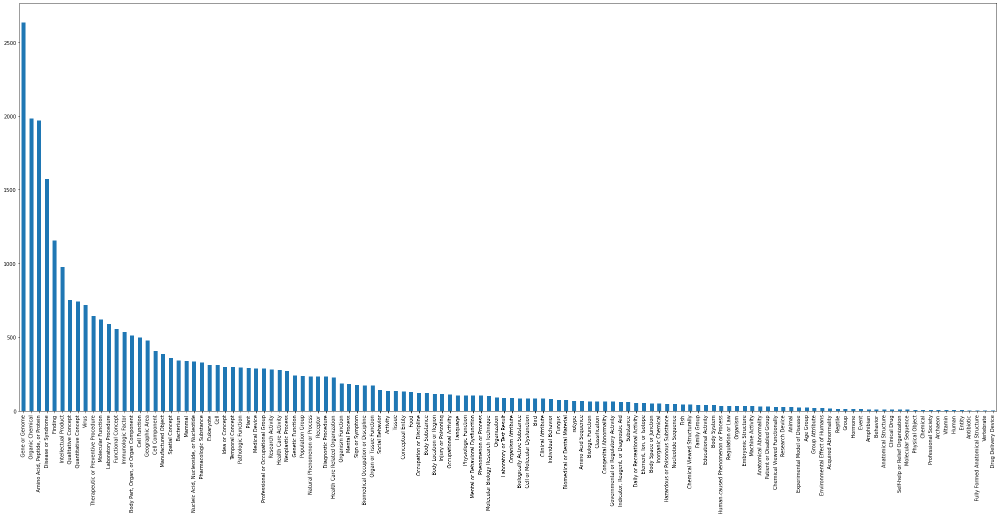

In [10]:
nodes["semtyp"].value_counts().plot(figsize=(35,15),kind='bar')

As we can see, our entites have 126 different types acquired from the UMLS through REST API

In [21]:
len(triples['relation'].unique())

2438

Since the dataset is very large and contains a lot of entites, it would be wiser to take only relevant entities and neglect the others 

In [83]:
def cui_to_type(cui):
    return nodes.semtyp.where(nodes.cui==cui).dropna().reset_index(drop=True)[0]
def cui_to_name(cui):
    return nodes.Name.where(nodes.cui==cui).dropna().dropna().reset_index(drop=True)[0]

In [18]:
for _i,row in tqdm(triples.iterrows()):
    if row[1] == 'catalyze':
        break

23255it [00:01, 22500.08it/s]


In [19]:
a=0
c=0
for index,row in tqdm(triples.iterrows()):
    if row[1] == "augmented":
        row[1] = "augment"
        a+=1
    if row[1] == "catalyzed" or row[1]=="catalyse":
        row[1] = "catalyze"
        c+=1       

402562it [00:19, 20382.40it/s]


In [22]:
c=0
for index,row in tqdm(triples.iterrows()):
    if row[1] == "binding":
        row[1] = "bind"
        a+=1
c

402562it [00:18, 22270.31it/s]


0

In [24]:
targetedges = [
                'reduce','increase','affect','inhibit','produce','decrease','trigger',
                'genarate','impact','limit','interfere','maintain','alter','bind','respond',
                'upregulate','secrete','accelerate','minimize','release','delay','dominate',
                'catalyse','ameliorate','altered','impede','react','reinforce','treat',
                'reproduce','stabilize','stimulate','augment','degrade','bound',
                'balance','replicate','host','substitute','fight','destabilize',
                'phagocytose','cristalyze','mutate','anesthetized'
                ]
len(targetedges)

45

In [25]:
#let's start with the diseases
targetnodes = [
                'Disease or Syndrome','Organic Chemical','Organism','Organism Function','Gene or Genome',
                'Virus','Sign or Symptom','Nucleotide Sequence','Molecular Function','Amino Acid, Peptide, or Protein',
                'Pharmacologic Substance','Genetic Function','Biologically Active Substance','Nucleic Acid, Nucleoside, or Nucleotide',
                'Body Substance','Organ or Tissue Function','Cell or Molecular Dysfunction','Cell Function', 'Substance',
                'Antibiotic','Chemical Viewed Functionally','Bacterium','Chemical','Anatomical Abnormality', 'Chemical Viewed Structurally',
                'Inorganic Chemical','Eukaryote','Biologic Function','Amino Acid Sequence','Vitamin','Molecular Sequence','Clinical Drug',
                ]
len(targetnodes)

32

In [31]:
targettriples = []
for _,row in tqdm(triples.iterrows()):
    if cui_to_type(row[0]) and cui_to_type(row[2]) in targetnodes:
        targettriples.append((row[0],row[1],row[2]))
len(targettriples)

402562it [47:31, 141.17it/s]


125567

In [32]:
import pickle

with open('targettriples.pkl', 'wb') as f:
    pickle.dump(targettriples,f)

In [33]:
newedges = []
for t in tqdm(targettriples):
    if t[1] not in newedges:
        newedges.append(t)

len(newedges)

100%|██████████| 125567/125567 [02:19<00:00, 897.97it/s]


125567

In [35]:
filterededges = []
for e in tqdm(newedges):
    if e in targetedges:
        break

100%|██████████| 125567/125567 [00:00<00:00, 969175.00it/s] 


In [37]:
targettriples2 = []
for _,row in tqdm(triples.iterrows()):
    if row[1] in targetedges:
        targettriples2.append(row)
len(targettriples2)

402562it [00:18, 21496.86it/s]


44213

In [40]:
newt = []
for t in tqdm(targettriples2):
    if cui_to_type(t[0]) in targetnodes and cui_to_type(t[2]) in targetnodes:
        newt.append(t)
len(newt)

100%|██████████| 44213/44213 [03:30<00:00, 210.34it/s]


6234

In [42]:
with open("newt.pkl",'wb') as f:
    pickle.dump(newt,f)

In [86]:
pairs = pd.DataFrame(newt,columns=['sub_id','relation','obj_id'])
pairs.head()

,sub_id,relation,obj_id
427,C0012634,increase,C0009450
1097,C0003015,increase,C1422064
1103,C0071097,increase,C1422064
1106,C0020740,increase,C1422064
2351,C0206750,increase,C0035204


In [85]:
print(cui_to_name('C0439663'))

Infected


In [84]:
for _,r in tqdm(pairs.iterrows()):
    print(r[0])
    break

0it [00:00, ?it/s]

C0012634


In [87]:
for _,r in tqdm(pairs.iterrows()):
    r[0] = cui_to_name(r[0])
    r[2] = cui_to_name(r[2])

pairs.head()

6234it [00:46, 134.07it/s]


,sub_id,relation,obj_id
427,Disease,increase,Communicable Diseases
1097,Angiotensin-Converting Enzyme Inhibitors,increase,ACE2 gene
1103,pioglitazone,increase,ACE2 gene
1106,ibuprofen,increase,ACE2 gene
2351,Coronavirus Infections,increase,Respiration Disorders


In [67]:
pairs.head()

,sub_id,relation,obj_id
427,None,increase,None
1097,None,increase,None
1103,None,increase,None
1106,None,increase,None
2351,None,increase,None


In [45]:
import networkx as nx
import matplotlib.pyplot as plt

In [53]:
k_graph = nx.from_pandas_edgelist(pairs, 'sub_id', 'obj_id',create_using=nx.MultiDiGraph())

In [56]:
k_graph['C0012634']['C0009450']

AtlasView({0: {}, 1: {}})

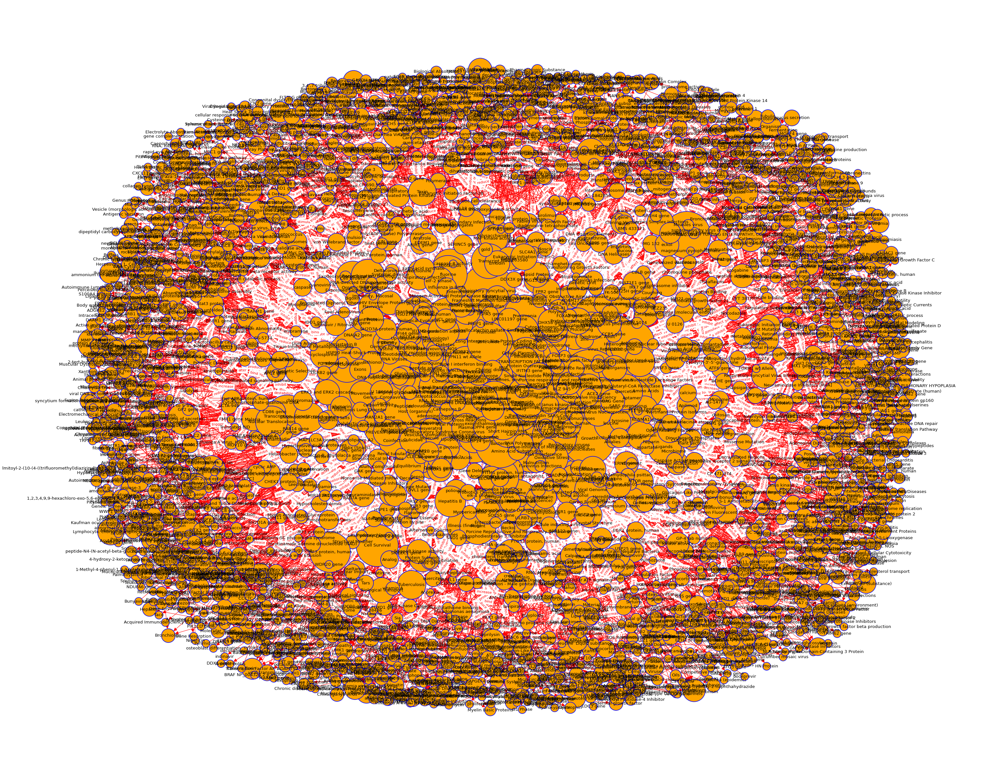

In [89]:
k_graph = nx.from_pandas_edgelist(pairs, 'sub_id', 'obj_id',
        create_using=nx.MultiDiGraph())

node_deg = nx.degree(k_graph)
layout = nx.spring_layout(k_graph, k=0.15, iterations=20)
plt.figure(num=None, figsize=(50, 40), dpi=80)
nx.draw_networkx(
    k_graph,
    node_size=[int(deg[1]) * 500 for deg in node_deg],
    arrowsize=20,
    linewidths=1.5,
    pos=layout,
    edge_color='red',
    edgecolors='blue',
    node_color='orange',
    )
labels = dict(zip(list(zip(pairs.sub_id, pairs.obj_id)),
                pairs['relation'].tolist()))
nx.draw_networkx_edge_labels(k_graph, pos=layout, edge_labels=labels,
                                font_color='red')
plt.axis('off')
plt.show()



In [133]:
for _,row in tqdm(nodes.iterrows()):
    G.add_node(row[0],Type=row[1],Name=row[2])
for _,row in tqdm(triples.iterrows()):
    G.add_edge(row[0],row[2],relation=row[1])

29069it [00:03, 7727.86it/s]
413094it [00:53, 7734.74it/s]


In [134]:
for node in G.nodes(data=True):
    print(node)
    break

('C0439663', {'Type': 'Finding', 'Name': 'Infected'})


In [135]:
for edge in G.edges(data=True):
    print(edge)
    break

('C0439663', 'C0011065', {'relation': 'cause'})


In [136]:
DiseaseSubNodes = (node for node,data in G.nodes(data=True) if data.get("Type")=="Disease or Syndrome")
DiseaseSubGraph = G.subgraph(DiseaseSubNodes)
print(len(DiseaseSubGraph.nodes))
print(len(DiseaseSubGraph.edges))

1572
1326


In [137]:
ChemSubNode = (node for node,data in G.nodes(data=True) if data.get('Type') in chemiclas)
ChemSubGraph = G.subgraph(ChemSubNode)
print(len(ChemSubGraph.nodes))
print(len(ChemSubGraph.edges))

1982
490


### Our graph contains more than 1500 entities refering to diseases and symptoms, let's see how they are connected to each others

In [50]:
Dnodes = (node for node,data in G.nodes(data=True) if data.get("Type")=="Disease or Syndrome")
DiseaseG = G.subgraph(Dnodes)
len(DiseaseG.nodes)

1572

In [84]:
print(len(DiseaseG.edges))
Dedges = []
for edge in DiseaseG.edges(data=True):
    Dedges.append([edge[0],edge[1],edge[2]['relation']])

2072


In [95]:
df = pd.DataFrame(Dedges, columns=['sub','obj','pre'])
df.head()

,sub,obj,pre
0,C0162671,C0009450,show
1,C0019159,C0162557,cause
2,C0019159,C0009450,challenging
3,C0019159,C0009450,present
4,C0019159,C0019159,yield


In [87]:
len(df.pre.unique())

352

In [86]:
len(df.pre)

2072

In [93]:
df = df.pre.astype('category')

In [96]:
df.describe()

,sub,obj,pre
count,2072,2072,2072
unique,436,420,352
top,C0009450,C0009450,cause
freq,247,259,210


In [97]:
df = df.groupby("pre").count()

In [102]:
df.sort_values(['sub','obj'],ascending=False)

,sub,obj
pre,,
cause,210,210
have,202,202
show,71,71
increase,70,70
characterize,66,66
...,...,...
vary,1,1
vivo,1,1
warrant,1,1


In [54]:
len(nx.get_edge_attributes(DiseaseG,"relation"))

2072

In [57]:
relations = nx.get_edge_attributes(DiseaseG,"relation")
relations

{('C0162671', 'C0009450', 0): 'show',
 ('C0019159', 'C0162557', 0): 'cause',
 ('C0019159', 'C0009450', 0): 'challenging',
 ('C0019159', 'C0009450', 1): 'present',
 ('C0019159', 'C0019159', 0): 'yield',
 ('C0019159', 'C0019159', 1): 'constitute',
 ('C0019159', 'C0041296', 0): 'cause',
 ('C0019159', 'C0001175', 0): 'cause',
 ('C0019159', 'C0024530', 0): 'cause',
 ('C1850106', 'C0175693', 0): 'form',
 ('C0039494', 'C0039494', 0): 'show',
 ('C0039494', 'C0039494', 1): 'interact',
 ('C0039494', 'C0039494', 2): 'demonstrate',
 ('C0039494', 'C0039494', 3): 'allow',
 ('C0242852', 'C0242852', 0): 'express',
 ('C0442886', 'C5203670', 0): 'exacerbate',
 ('C0442886', 'C0012634', 0): 'suggest',
 ('C0442886', 'C0009450', 0): 'depend',
 ('C0442886', 'C0442886', 0): 'recover',
 ('C0442886', 'C0032285', 0): 'cause',
 ('C0442886', 'C0085584', 0): 'cause',
 ('C0442886', 'C0004626', 0): 'precipitate',
 ('C0442886', 'C0948192', 0): 'neutralize',
 ('C0442886', 'C4025886', 0): 'provide',
 ('C0036918', 'C0019

In [62]:
relations.values()

dict_values(['show', 'cause', 'challenging', 'present', 'yield', 'constitute', 'cause', 'cause', 'cause', 'form', 'show', 'interact', 'demonstrate', 'allow', 'express', 'exacerbate', 'suggest', 'depend', 'recover', 'cause', 'cause', 'precipitate', 'neutralize', 'provide', 'worsen', 'describe', 'target', 'target', 'cause', 'complicate', 'meet', 'reveal', 'reveal', 'affect', 'promote', 'have', 'affect', 'have', 'look', 'divided', 'elevated', 'complicated', 'give', 'regulate', 'undertake', 'increase', 'necessitate', 'identify', 'identify', 'accumulate', 'produce', 'elucidate', 'predict', 'show', 'show', 'have', 'have', 'have', 'confirm', 'increase', 'have', 'cause', 'have', 'characterize', 'exacerbate', 'cause', 'herald', 'prevent', 'induce', 'show', 'play', 'cause', 'need', 'identifie', 'complicated', 'complicated', 'identify', 'cause', 'cause', 'cause', 'induce', 'present', 'have', 'cause', 'characterize', 'cause', 'represent', 'evidencing', 'characterize', 'underlie', 'underlie', 'unde